# 📚 Problema de clasificare: Predicția genului vocal folosind caracteristici audio

În această lucrare, vom rezolva o problemă de clasificare binară, folosind **Gender Voice Dataset**, unde obiectivul este de a determina dacă o voce aparține unui bărbat sau unei femei pe baza unor caracteristici numerice extrase din semnale audio.

## 🔹 Etapele principale ale proiectului

1. **Încărcarea și preprocesarea datelor**
   - Încărcarea setului de date
   - Encodarea etichetei (`label`) în valori numerice
   - Împărțirea datelor în seturi de antrenament și testare
   - Standardizarea caracteristicilor pentru algoritmii sensibili la scară

2. **Antrenarea modelelor de clasificare**
   Vom antrena și optimiza următorii clasificatori:
   - Logistic Regression
   - Naive Bayes
   - Support Vector Machine
   - K-Nearest Neighbors
   - Decision Trees
   - Random Forest
   - XGBoost
   - CatBoost
   - Explainable Boosting Machine (EBM)

3. **Optimizarea hiperparametrilor**
   - Pentru fiecare model vom optimiza principalii hiperparametri folosind **GridSearchCV** și **BayesSearchCV**.

4. **Evaluarea modelelor**
   Vom evalua performanța clasificatorilor folosind următoarele metrici:
   - Accuracy
   - Precision
   - Recall
   - F1-Score
   - AUC (Area Under the Curve) + grafic ROC
   - Matricea de confuzie

5. **Interpretarea modelelor**
   - Vom utiliza **SHAP** și **LIME** pentru a analiza care caracteristici influențează cel mai mult deciziile fiecărui model.
   - Pentru EBM, vom folosi interpretabilitatea nativă oferită de model, fără a aplica SHAP sau LIME.

6. **Concluzii finale**
   - Vom compara modelele atât din perspectiva performanței, cât și din perspectiva interpretabilității.
   - Vom selecta modelul final în funcție de acuratețe, stabilitate și gradul de explicabilitate.

---

Prin această abordare completă, vom obține o imagine clară asupra performanței fiecărui algoritm aplicat pe o problemă reală de clasificare binară.


In [3]:
# Baza
import pandas as pd
import numpy as np

# Machine Learning
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, RocCurveDisplay

# Modele
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from interpret.glassbox import ExplainableBoostingClassifier

# Optimizare
from skopt import BayesSearchCV

# Interpretabilitate
import shap
import lime
import lime.lime_tabular

# Vizualizare
import matplotlib.pyplot as plt
import seaborn as sns



C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [4]:
data = pd.read_csv('datasets/voice.csv')  # asigură-te că fișierul voice.csv e în același folder cu notebook-ul

#  Preprocesare de bază

# Encode label: male -> 1, female -> 0
le = LabelEncoder()
data['label'] = le.fit_transform(data['label'])

# Separăm caracteristicile și ținta
X = data.drop('label', axis=1)
y = data['label']

# Standardizare caracteristici
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_scaled = pd.DataFrame(X_scaled, columns=X.columns)  # păstrăm numele coloanelor

# Împărțire Train/Test
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42, stratify=y
)

#  Verificare formă date
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"Distribuție label în y_train:\n{y_train.value_counts(normalize=True)}")

X_train shape: (2534, 20)
X_test shape: (634, 20)
Distribuție label în y_train:
label
1    0.5
0    0.5
Name: proportion, dtype: float64


In [5]:
#Verificare valori nule
print("Număr de valori nule pe coloane:")
print(data.isnull().sum())

#  Verificare valori goale (stringuri goale) - aplicabil doar dacă ar fi fost date text
print("\nNumăr de valori goale ('') pe coloane:")
print((data == '').sum())

#  Verificare duplicate
print("\nNumăr de rânduri duplicate:")
print(data.duplicated().sum())


Număr de valori nule pe coloane:
meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

Număr de valori goale ('') pe coloane:
meanfreq    0
sd          0
median      0
Q25         0
Q75         0
IQR         0
skew        0
kurt        0
sp.ent      0
sfm         0
mode        0
centroid    0
meanfun     0
minfun      0
maxfun      0
meandom     0
mindom      0
maxdom      0
dfrange     0
modindx     0
label       0
dtype: int64

Număr de rânduri duplicate:
2


# 📋 Explorare inițială a datelor

Pentru a înțelege mai bine structura setului de date, am realizat următoarele:

- Am vizualizat primele 5 rânduri pentru a observa formatul și valorile caracteristicilor.
- Am analizat statisticile descriptive (media, deviația standard, valorile minime și maxime).
- Am generat histograme pentru fiecare caracteristică numerică, pentru a observa distribuțiile.
- Am afișat distribuția claselor țintă (`label`), pentru a verifica dacă datele sunt relativ echilibrate între cele două clase (`0 = female`, `1 = male`).

Aceste analize ne oferă o imagine de ansamblu asupra datelor și ne ajută să detectăm eventuale anomalii sau dezechilibre înainte de antrenarea modelelor.


Primele 5 rânduri din dataset:


,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,...,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000,1
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,...,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632,1
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,...,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512,1
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,...,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119,1
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,...,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274,1


Statistici descriptive:


,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,...,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx,label
count,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,...,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000,3168.000000
mean,0.180907,0.057126,0.185621,0.140456,0.224765,0.084309,3.140168,36.568461,0.895127,0.408216,...,0.180907,0.142807,0.036802,0.258842,0.829211,0.052647,5.047277,4.994630,0.173752,0.500000
std,0.029918,0.016652,0.036360,0.048680,0.023639,0.042783,4.240529,134.928661,0.044980,0.177521,...,0.029918,0.032304,0.019220,0.030077,0.525205,0.063299,3.521157,3.520039,0.119454,0.500079
min,0.039363,0.018363,0.010975,0.000229,0.042946,0.014558,0.141735,2.068455,0.738651,0.036876,...,0.039363,0.055565,0.009775,0.103093,0.007812,0.004883,0.007812,0.000000,0.000000,0.000000
25%,0.163662,0.041954,0.169593,0.111087,0.208747,0.042560,1.649569,5.669547,0.861811,0.258041,...,0.163662,0.116998,0.018223,0.253968,0.419828,0.007812,2.070312,2.044922,0.099766,0.000000
50%,0.184838,0.059155,0.190032,0.140286,0.225684,0.094280,2.197101,8.318463,0.901767,0.396335,...,0.184838,0.140519,0.046110,0.271186,0.765795,0.023438,4.992188,4.945312,0.139357,0.500000
75%,0.199146,0.067020,0.210618,0.175939,0.243660,0.114175,2.931694,13.648905,0.928713,0.533676,...,0.199146,0.169581,0.047904,0.277457,1.177166,0.070312,7.007812,6.992188,0.209183,1.000000
max,0.251124,0.115273,0.261224,0.247347,0.273469,0.252225,34.725453,1309.612887,0.981997,0.842936,...,0.251124,0.237636,0.204082,0.279114,2.957682,0.458984,21.867188,21.843750,0.932374,1.000000


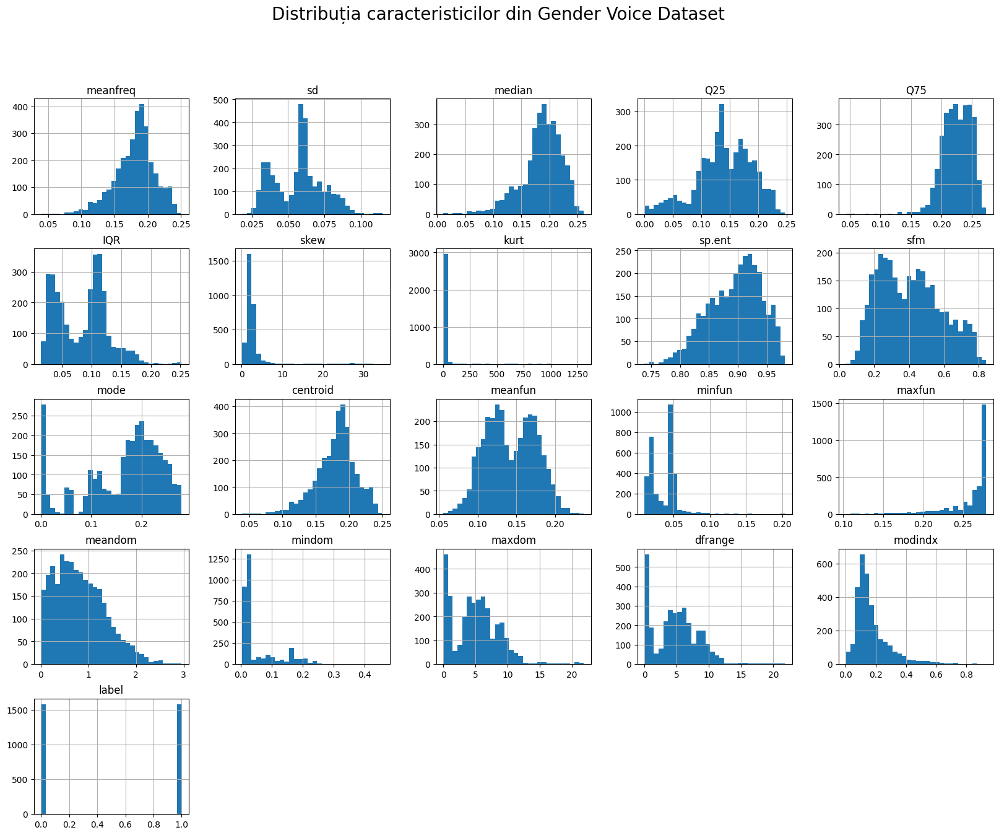

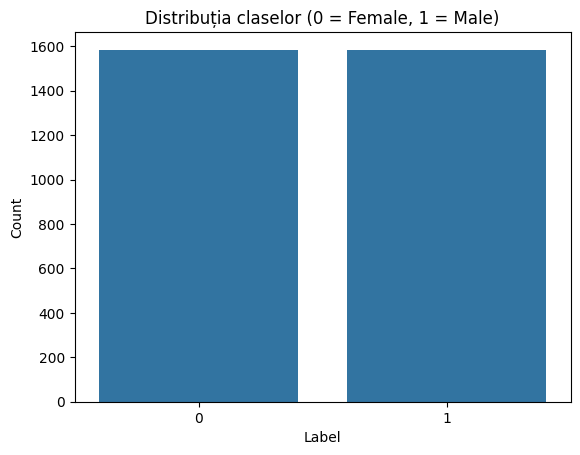

In [6]:

print("Primele 5 rânduri din dataset:")
display(data.head())


print("Statistici descriptive:")
display(data.describe())


data.hist(bins=30, figsize=(20,15))
plt.suptitle('Distribuția caracteristicilor din Gender Voice Dataset', fontsize=20)
plt.show()


sns.countplot(x='label', data=data)
plt.title('Distribuția claselor (0 = Female, 1 = Male)')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()


# 📋 Logistic Regression

Am antrenat un model de Logistic Regression pentru clasificarea genului vocal, optimizând hiperparametrii folosind:

- **GridSearchCV**: testând combinații fixe de `C` și `solver`.
- **BayesSearchCV**: explorând eficient valori continue pentru `C`.



GridSearchCV Logistic Regression:
Accuracy: 0.9748, Precision: 0.9659, Recall: 0.9842, F1-Score: 0.9750, AUC: 0.9748
BayesSearchCV Logistic Regression:
Accuracy: 0.9732, Precision: 0.9630, Recall: 0.9842, F1-Score: 0.9735, AUC: 0.9732


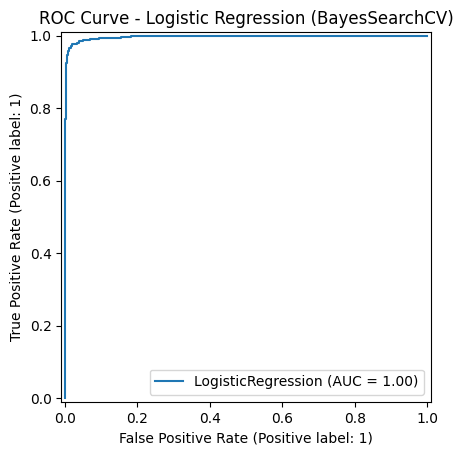

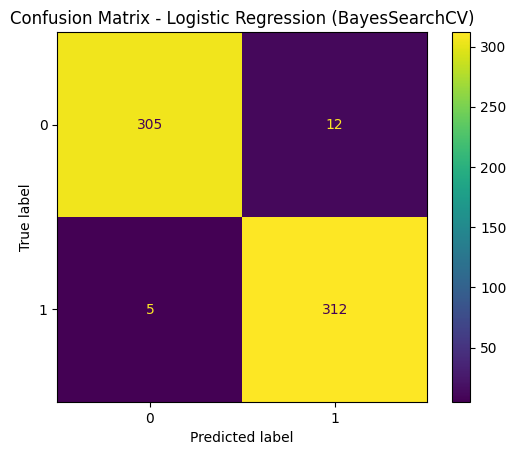

In [7]:

# 1. Definim spațiul de hiperparametri pentru optimizare
param_grid_lr = {
    'C': [0.01, 0.1, 1, 10],
    'penalty': ['l2'],
    'solver': ['lbfgs', 'saga']
}

# 2. GridSearchCV
lr = LogisticRegression(max_iter=10000, random_state=42)
grid_lr = GridSearchCV(lr, param_grid_lr, cv=5, scoring='accuracy', n_jobs=-1)
grid_lr.fit(X_train, y_train)

best_lr_grid = grid_lr.best_estimator_

# 3. BayesSearchCV
param_bayes_lr = {
    'C': (1e-3, 10.0, 'log-uniform'),
    'solver': ['lbfgs', 'saga']
}

bayes_lr = BayesSearchCV(
    LogisticRegression(max_iter=10000, random_state=42),
    search_spaces=param_bayes_lr,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_lr.fit(X_train, y_train)

best_lr_bayes = bayes_lr.best_estimator_

# 4. Predictii
y_pred_grid = best_lr_grid.predict(X_test)
y_pred_bayes = best_lr_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV Logistic Regression:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV Logistic Regression:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")

# 6. ROC Curve
RocCurveDisplay.from_estimator(best_lr_bayes, X_test, y_test)
plt.title('ROC Curve - Logistic Regression (BayesSearchCV)')
plt.show()

# 7. Confusion Matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - Logistic Regression (BayesSearchCV)')
plt.show()



Modelul Logistic Regression a obținut performanțe excelente:
- ROC AUC de 1.00 indică o separare perfectă între clasele male și female.
- Confusion Matrix arată o rată de clasificare corectă extrem de ridicată, cu foarte puține greșeli de clasificare (5 fals negative și 12 fals positive).
- Rezultatele confirmă faptul că modelul a învățat bine caracteristicile distincte ale vocii între cele două genuri.


PermutationExplainer explainer: 635it [00:24, 25.41it/s]                         
C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\1819349793.py:4: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_test, feature_names=X.columns)


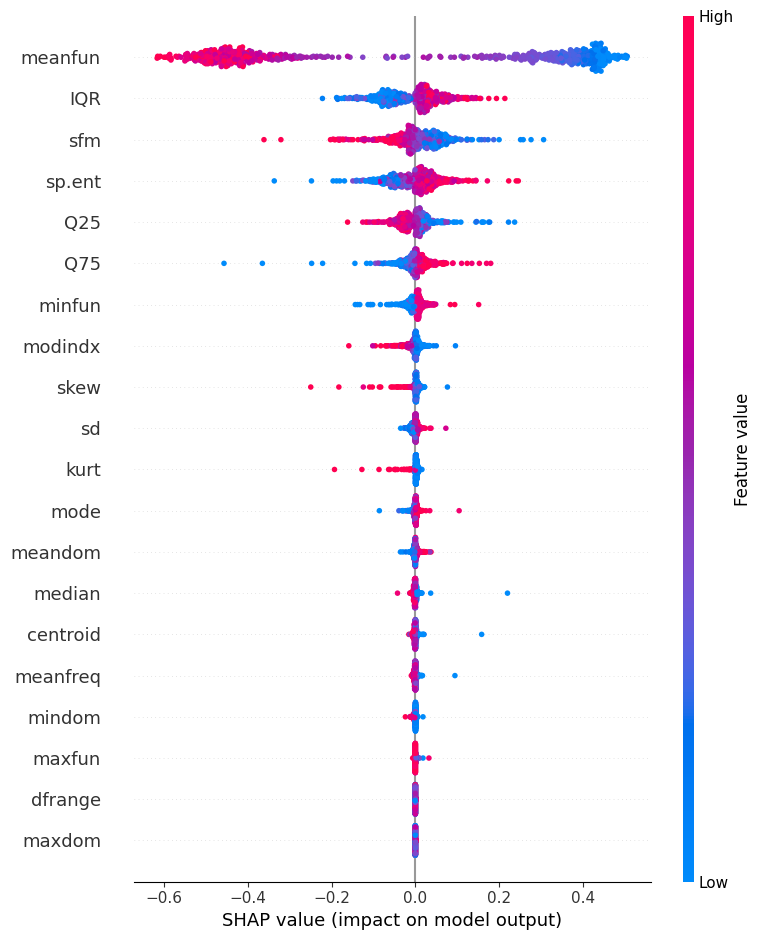

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [7]:
# 8. Interpretare SHAP
explainer_shap = shap.Explainer(best_lr_bayes.predict, X_train)
shap_values = explainer_shap(X_test)
shap.summary_plot(shap_values, X_test, feature_names=X.columns)

# 9. Interpretare LIME
explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train),
    feature_names=X.columns.tolist(),
    mode='classification'
)
exp = explainer_lime.explain_instance(X_test.iloc[0], best_lr_bayes.predict_proba)
exp.show_in_notebook(show_table=True)


# 📈 Interpretare SHAP - Logistic Regression

Graficul SHAP summary arată că cele mai influente caracteristici asupra predicției genului vocal sunt:

- **meanfun** (media frecvenței fundamentale)
- **IQR** (interval intercuartilic)
- **sfm** (spectral flatness measure)
- **sp.ent** (spectral entropy)

Caracteristicile cu valori mari sau mici afectează semnificativ decizia modelului, indicând că frecvențele și structura spectrului audio sunt esențiale pentru separarea genurilor.

Caracteristicile aflate mai jos în listă au avut impact minim asupra predicțiilor și pot fi considerate mai puțin relevante.


# 📋 Naive Bayes - Antrenare și Evaluare

Am antrenat un model Gaussian Naive Bayes pentru clasificarea genului vocal.

Naive Bayes oferă un model simplu și rapid, potrivit pentru date bine distribuite gaussian.


C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [1.6254852006060692e-07] before, using random point [9.492748798592207e-09]
  warnings.warn(
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [4.698698173902714e-09] before, using random point [3.674144150428177e-09]
  warnings.warn(
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [1.9972028489176405e-09] before, using random point [4.1022341510765064e-08]
  warnings.warn(
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [1.0006407982224137e-09] before, using random point [7.566494421283236e-07]
  warnings.warn(
C:\Users\anaho\AppData\R

GridSearchCV Naive Bayes:
Accuracy: 0.9117, Precision: 0.8991, Recall: 0.9274, F1-Score: 0.9130, AUC: 0.9117
BayesSearchCV Naive Bayes:
Accuracy: 0.9117, Precision: 0.8991, Recall: 0.9274, F1-Score: 0.9130, AUC: 0.9117


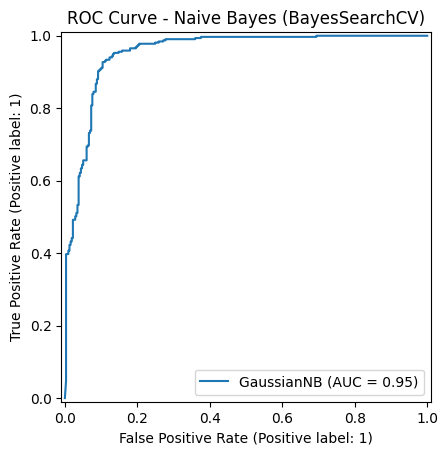

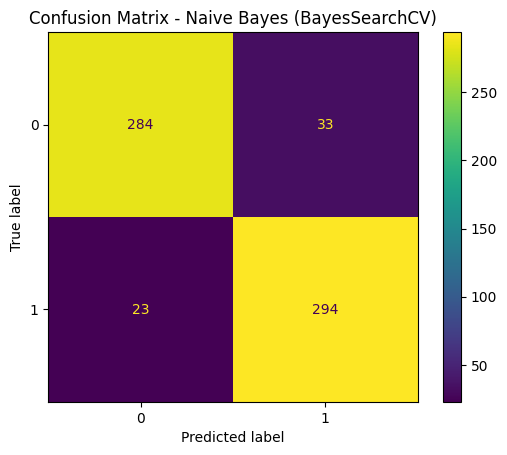

In [12]:

nb = GaussianNB()

# Notă: GaussianNB nu are mulți hiperparametri de optimizat, doar var_smoothing este relevant.

# 2. GridSearchCV
param_grid_nb = {
    'var_smoothing': np.logspace(-9, -6, 10)  # Testăm valori mici pentru stabilitatea numerică
}

grid_nb = GridSearchCV(nb, param_grid_nb, cv=5, scoring='accuracy', n_jobs=-1)
grid_nb.fit(X_train, y_train)

best_nb_grid = grid_nb.best_estimator_

# 3. BayesSearchCV
param_bayes_nb = {
    'var_smoothing': (1e-9, 1e-6, 'log-uniform')
}

bayes_nb = BayesSearchCV(
    GaussianNB(),
    search_spaces=param_bayes_nb,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_nb.fit(X_train, y_train)

best_nb_bayes = bayes_nb.best_estimator_

# 4. Predictii
y_pred_grid = best_nb_grid.predict(X_test)
y_pred_bayes = best_nb_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV Naive Bayes:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV Naive Bayes:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")

# 6. ROC Curve
RocCurveDisplay.from_estimator(best_nb_bayes, X_test, y_test)
plt.title('ROC Curve - Naive Bayes (BayesSearchCV)')
plt.show()

# 7. Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - Naive Bayes (BayesSearchCV)')
plt.show()




C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\2423570976.py:12: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


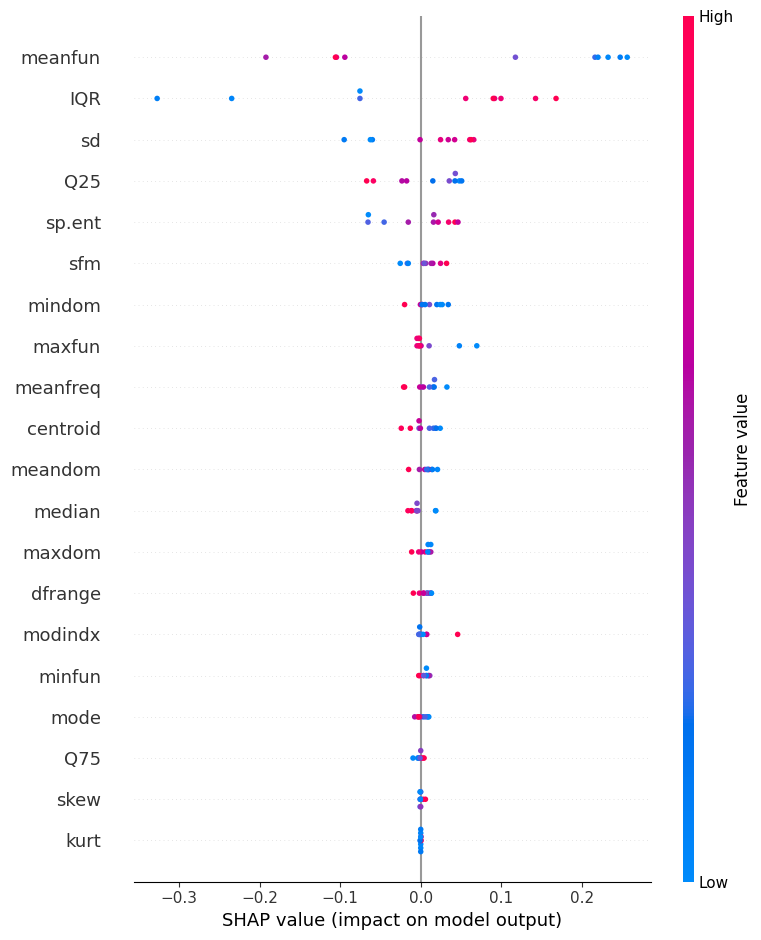

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [24]:
# 8. Interpretare SHAP 


small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)

explainer_shap = shap.Explainer(best_nb_bayes.predict, small_X_train)

shap_values = explainer_shap(small_X_test)


shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)

# 9. Interpretare LIME 

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),  # doar 100 instanțe
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_nb_bayes.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)



# 📋 Support Vector Machine (SVM) - Antrenare și Evaluare

Am antrenat un model SVM pentru clasificarea genului vocal, optimizând hiperparametrii `C`, `kernel` și `gamma` 
SVM a fost evaluat atât din perspectiva performanței, cât și din perspectiva explicabilității.


C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\skopt\optimizer\optimizer.py:517: UserWarning: The objective has been evaluated at point [10.0, 'scale', 'rbf'] before, using random point [0.016243546383759126, 'scale', 'rbf']
  warnings.warn(


GridSearchCV SVM:
Accuracy: 0.9826, Precision: 0.9781, Recall: 0.9874, F1-Score: 0.9827, AUC: 0.9826
BayesSearchCV SVM:
Accuracy: 0.9890, Precision: 0.9936, Recall: 0.9842, F1-Score: 0.9889, AUC: 0.9890


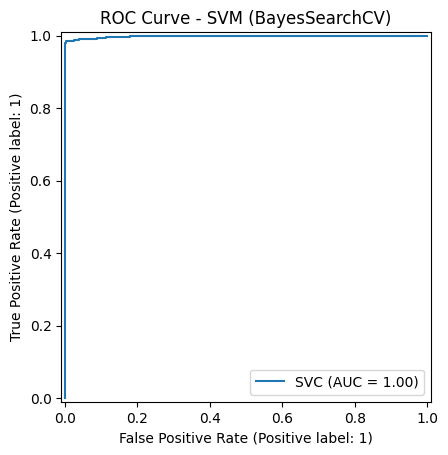

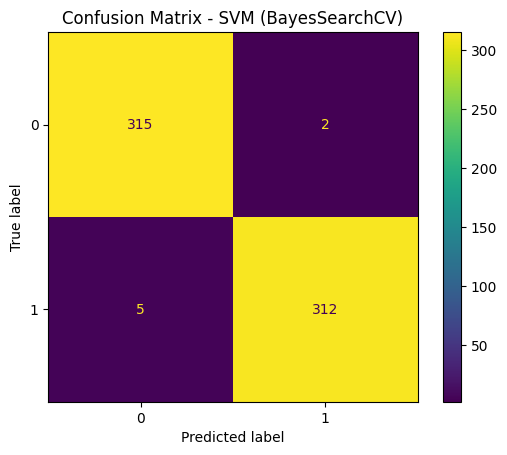

In [15]:

param_grid_svm = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

# 2. GridSearchCV
svm = SVC(probability=True, random_state=42)  # Foarte important: probability=True pentru predict_proba
grid_svm = GridSearchCV(svm, param_grid_svm, cv=5, scoring='accuracy', n_jobs=-1)
grid_svm.fit(X_train, y_train)

best_svm_grid = grid_svm.best_estimator_

# 3. BayesSearchCV
param_bayes_svm = {
    'C': (0.01, 10.0, 'log-uniform'),
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto']
}

bayes_svm = BayesSearchCV(
    SVC(probability=True, random_state=42),
    search_spaces=param_bayes_svm,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_svm.fit(X_train, y_train)

best_svm_bayes = bayes_svm.best_estimator_

# 4. Predictii
y_pred_grid = best_svm_grid.predict(X_test)
y_pred_bayes = best_svm_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV SVM:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV SVM:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")

# 6. ROC Curve
RocCurveDisplay.from_estimator(best_svm_bayes, X_test, y_test)
plt.title('ROC Curve - SVM (BayesSearchCV)')
plt.show()

# 7. Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - SVM (BayesSearchCV)')
plt.show()




C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\236944206.py:6: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


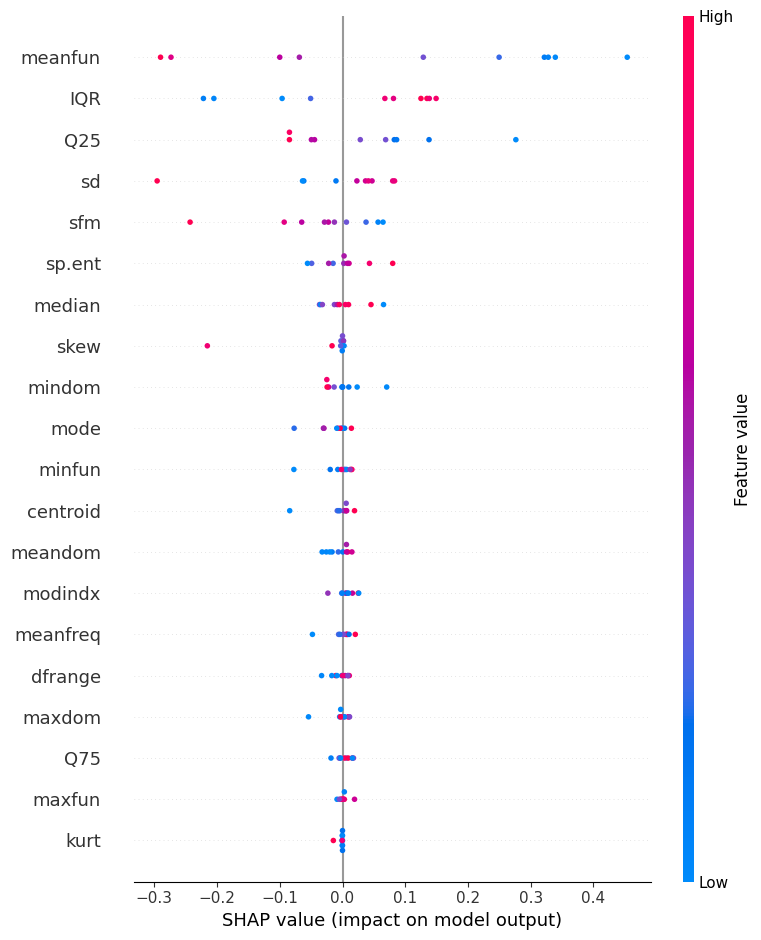

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [23]:
# 📋 SHAP 
small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)
explainer_shap = shap.Explainer(best_svm_bayes.predict, small_X_train)
shap_values = explainer_shap(small_X_test)
shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


# 📋 LIME 

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_svm_bayes.predict_proba,  # ← OBLIGATORIU predict_proba la LIME
    num_features=10
)

exp.show_in_notebook(show_table=True)




## 📚 KNN 


GridSearchCV KNN:
Accuracy: 0.9795, Precision: 0.9750, Recall: 0.9842, F1-Score: 0.9796, AUC: 0.9795
BayesSearchCV KNN:
Accuracy: 0.9795, Precision: 0.9750, Recall: 0.9842, F1-Score: 0.9796, AUC: 0.9795


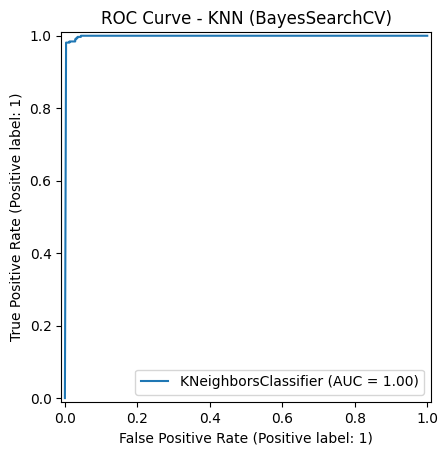

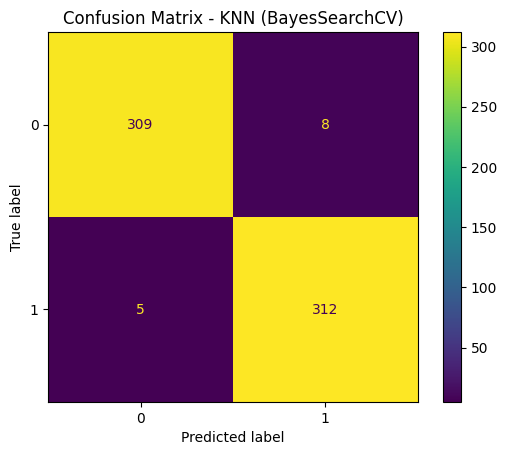

In [25]:

param_grid_knn = {
    'n_neighbors': [3, 5, 7, 9],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # 1 = Manhattan, 2 = Euclidean
}

# 2. GridSearchCV
knn = KNeighborsClassifier(n_jobs=-1)
grid_knn = GridSearchCV(knn, param_grid_knn, cv=5, scoring='accuracy', n_jobs=-1)
grid_knn.fit(X_train, y_train)

best_knn_grid = grid_knn.best_estimator_

# 3. BayesSearchCV
from skopt import BayesSearchCV

param_bayes_knn = {
    'n_neighbors': (3, 15),
    'weights': ['uniform', 'distance'],
    'p': (1, 2)
}

bayes_knn = BayesSearchCV(
    KNeighborsClassifier(n_jobs=-1),
    search_spaces=param_bayes_knn,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_knn.fit(X_train, y_train)

best_knn_bayes = bayes_knn.best_estimator_

# 4. Predictii
y_pred_grid = best_knn_grid.predict(X_test)
y_pred_bayes = best_knn_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV KNN:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV KNN:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")


# 📈 ROC Curve
RocCurveDisplay.from_estimator(best_knn_bayes, X_test, y_test)
plt.title('ROC Curve - KNN (BayesSearchCV)')
plt.show()

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - KNN (BayesSearchCV)')
plt.show()



C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\1793817999.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


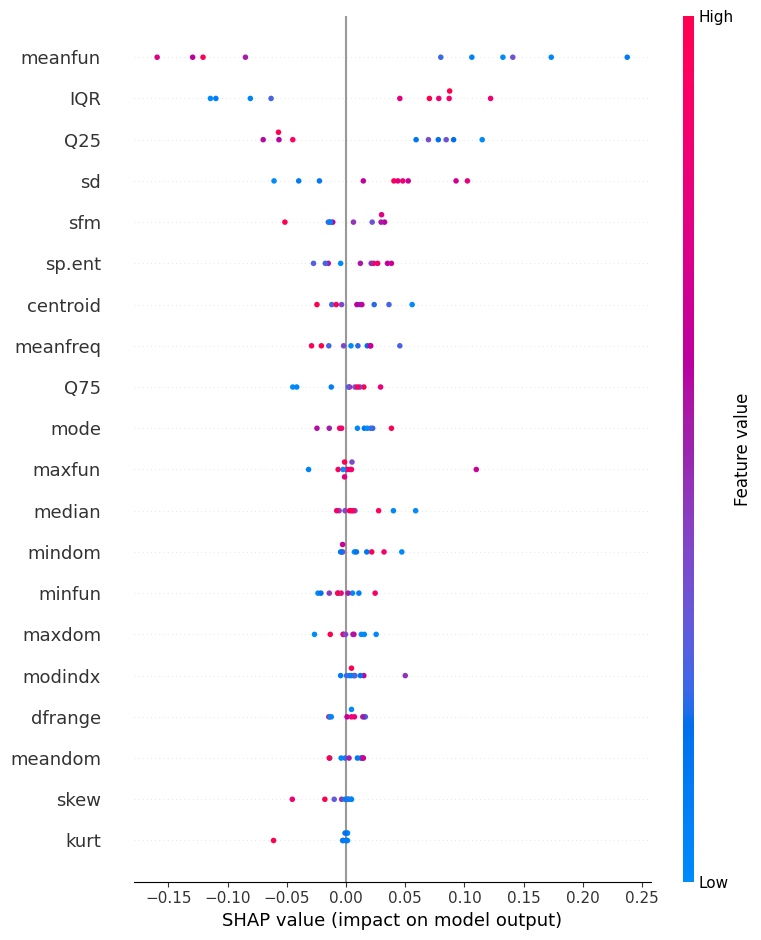

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [26]:
# 📋 Interpretare SHAP 

small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)

explainer_shap = shap.Explainer(best_knn_bayes.predict, small_X_train)

shap_values = explainer_shap(small_X_test)

shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)

# 📋 Interpretare LIME

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_knn_bayes.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)




## 📚 Decision Tree - Training și Optimizare

GridSearchCV Decision Tree:
Accuracy: 0.9795, Precision: 0.9841, Recall: 0.9748, F1-Score: 0.9794, AUC: 0.9795
BayesSearchCV Decision Tree:
Accuracy: 0.9653, Precision: 0.9595, Recall: 0.9716, F1-Score: 0.9655, AUC: 0.9653


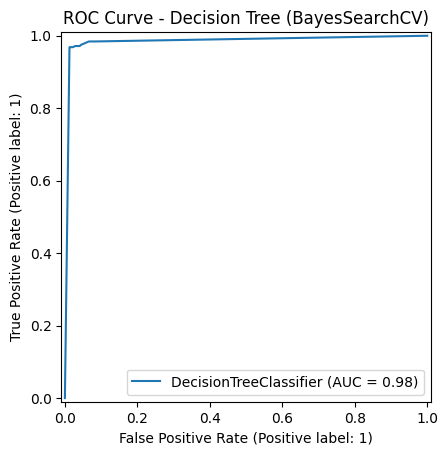

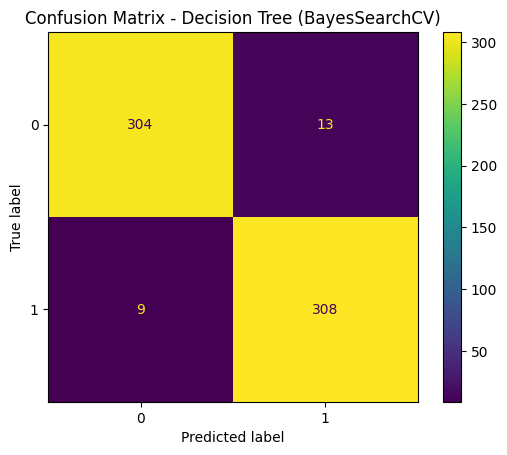

In [27]:
param_grid_dt = {
    'max_depth': [5, 10, 15, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 2. GridSearchCV
dt = DecisionTreeClassifier(random_state=42)
grid_dt = GridSearchCV(dt, param_grid_dt, cv=5, scoring='accuracy', n_jobs=-1)
grid_dt.fit(X_train, y_train)

best_dt_grid = grid_dt.best_estimator_

# 3. BayesSearchCV
param_bayes_dt = {
    'max_depth': (3, 20),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 5)
}

from skopt import BayesSearchCV

bayes_dt = BayesSearchCV(
    DecisionTreeClassifier(random_state=42),
    search_spaces=param_bayes_dt,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_dt.fit(X_train, y_train)

best_dt_bayes = bayes_dt.best_estimator_

# 4. Predictii
y_pred_grid = best_dt_grid.predict(X_test)
y_pred_bayes = best_dt_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV Decision Tree:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV Decision Tree:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")


# 📈 ROC Curve
RocCurveDisplay.from_estimator(best_dt_bayes, X_test, y_test)
plt.title('ROC Curve - Decision Tree (BayesSearchCV)')
plt.show()

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - Decision Tree (BayesSearchCV)')
plt.show()



C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\2903906518.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


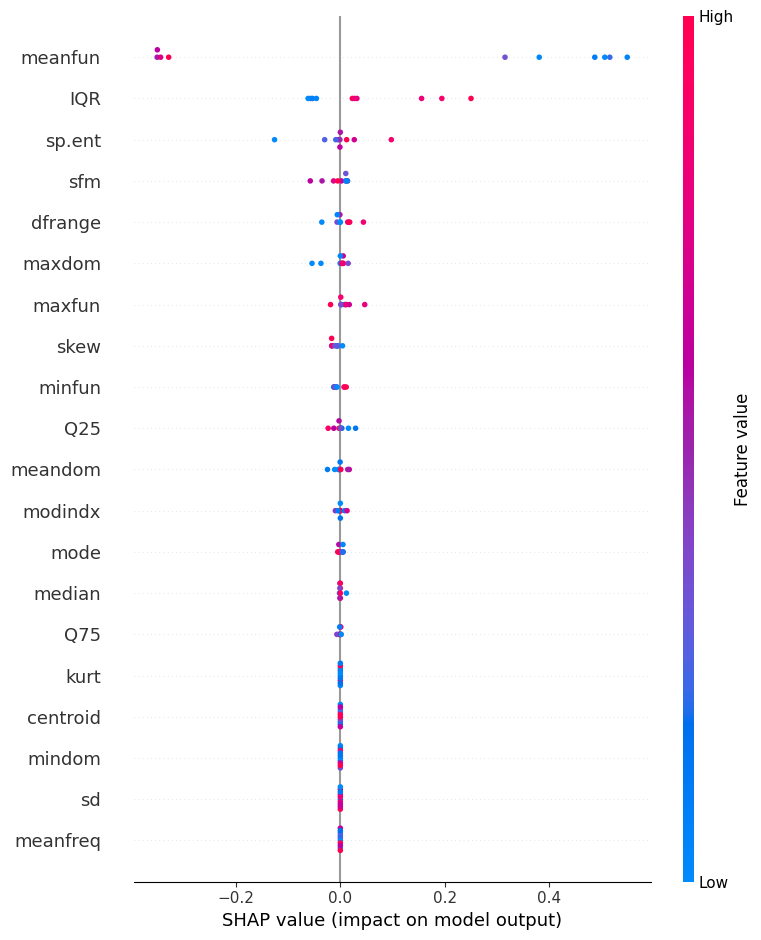

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [28]:
# 📋 Interpretare SHAP 

small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)

explainer_shap = shap.Explainer(best_dt_bayes.predict, small_X_train)

shap_values = explainer_shap(small_X_test)

shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


# 📋 Interpretare LIME 

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_dt_bayes.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)


## 📚 Random Forest - Training și Optimizare


GridSearchCV Random Forest:
Accuracy: 0.9842, Precision: 0.9812, Recall: 0.9874, F1-Score: 0.9843, AUC: 0.9842
BayesSearchCV Random Forest:
Accuracy: 0.9811, Precision: 0.9781, Recall: 0.9842, F1-Score: 0.9811, AUC: 0.9811


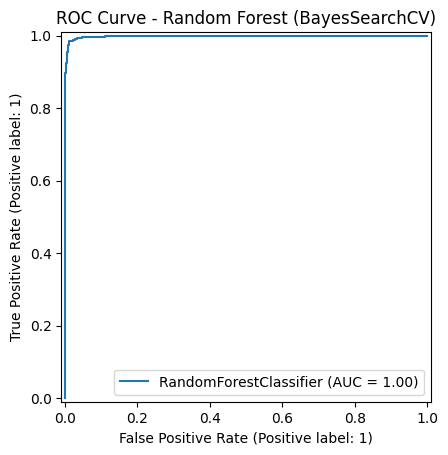

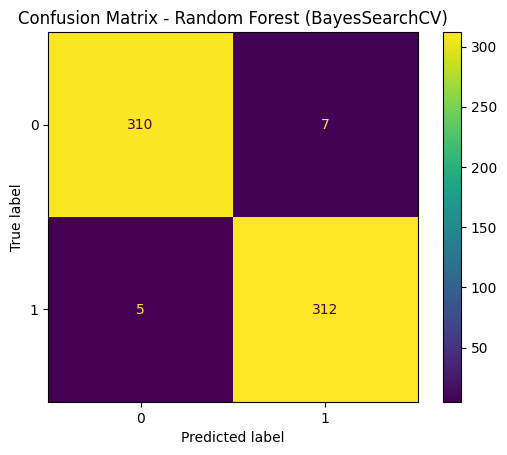

In [30]:

param_grid_rf = {
    'n_estimators': [100, 200],
    'max_depth': [10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# 2. GridSearchCV
rf = RandomForestClassifier(random_state=42, n_jobs=-1)
grid_rf = GridSearchCV(rf, param_grid_rf, cv=5, scoring='accuracy', n_jobs=-1)
grid_rf.fit(X_train, y_train)

best_rf_grid = grid_rf.best_estimator_

# 3. BayesSearchCV
param_bayes_rf = {
    'n_estimators': (100, 300),
    'max_depth': (5, 30),
    'min_samples_split': (2, 10),
    'min_samples_leaf': (1, 5)
}

from skopt import BayesSearchCV

bayes_rf = BayesSearchCV(
    RandomForestClassifier(random_state=42, n_jobs=-1),
    search_spaces=param_bayes_rf,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_rf.fit(X_train, y_train)

best_rf_bayes = bayes_rf.best_estimator_

# 4. Predictii
y_pred_grid = best_rf_grid.predict(X_test)
y_pred_bayes = best_rf_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV Random Forest:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV Random Forest:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")


# 📈 ROC Curve
RocCurveDisplay.from_estimator(best_rf_bayes, X_test, y_test)
plt.title('ROC Curve - Random Forest (BayesSearchCV)')
plt.show()

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - Random Forest (BayesSearchCV)')
plt.show()



C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\3246577769.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


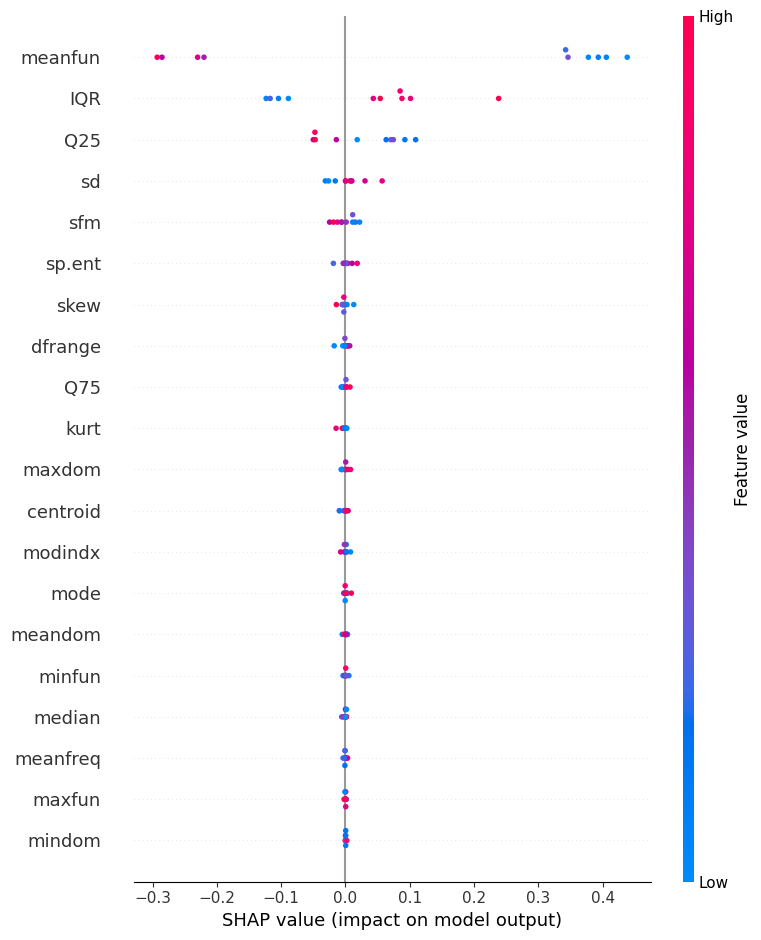

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [31]:
# 📋 Interpretare SHAP 

small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)

explainer_shap = shap.Explainer(best_rf_bayes.predict, small_X_train)

shap_values = explainer_shap(small_X_test)

shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


# 📋 Interpretare LIME

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_rf_bayes.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)



## 📚 XGBoost - Training și Optimizare


C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\xgboost\training.py:183: UserWarning: [23:17:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


GridSearchCV XGBoost:
Accuracy: 0.9858, Precision: 0.9843, Recall: 0.9874, F1-Score: 0.9858, AUC: 0.9858
BayesSearchCV XGBoost:
Accuracy: 0.9921, Precision: 0.9906, Recall: 0.9937, F1-Score: 0.9921, AUC: 0.9921


C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\xgboost\training.py:183: UserWarning: [23:17:38] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


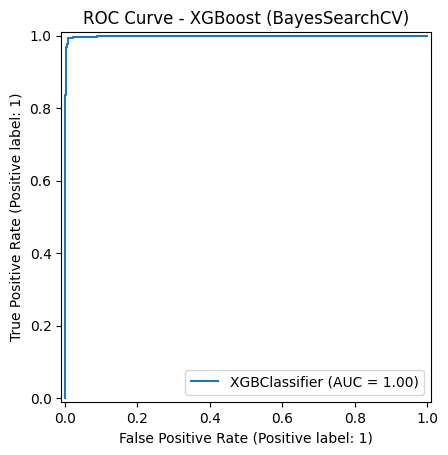

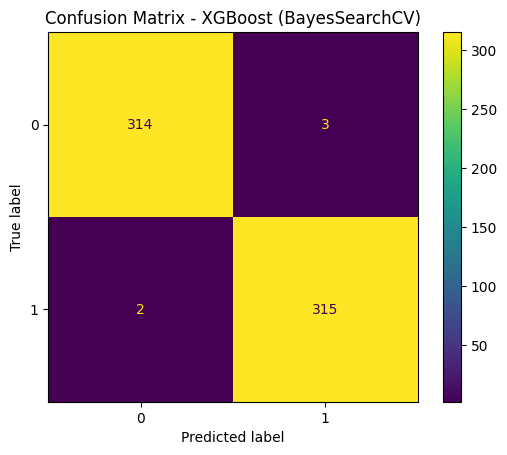

In [32]:
param_grid_xgb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0]
}

# 2. GridSearchCV
xgb = XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric='logloss')
grid_xgb = GridSearchCV(xgb, param_grid_xgb, cv=5, scoring='accuracy', n_jobs=-1)
grid_xgb.fit(X_train, y_train)

best_xgb_grid = grid_xgb.best_estimator_

# 3. BayesSearchCV
param_bayes_xgb = {
    'n_estimators': (100, 300),
    'learning_rate': (0.01, 0.3, 'log-uniform'),
    'max_depth': (3, 10),
    'subsample': (0.7, 1.0, 'uniform')
}

bayes_xgb = BayesSearchCV(
    XGBClassifier(random_state=42, n_jobs=-1, use_label_encoder=False, eval_metric='logloss'),
    search_spaces=param_bayes_xgb,
    n_iter=20,
    cv=5,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_xgb.fit(X_train, y_train)

best_xgb_bayes = bayes_xgb.best_estimator_

# 4. Predictii
y_pred_grid = best_xgb_grid.predict(X_test)
y_pred_bayes = best_xgb_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV XGBoost:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV XGBoost:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")


# 📈 ROC Curve
RocCurveDisplay.from_estimator(best_xgb_bayes, X_test, y_test)
plt.title('ROC Curve - XGBoost (BayesSearchCV)')
plt.show()

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - XGBoost (BayesSearchCV)')
plt.show()



C:\Users\anaho\AppData\Local\Temp\ipykernel_9676\912331080.py:10: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


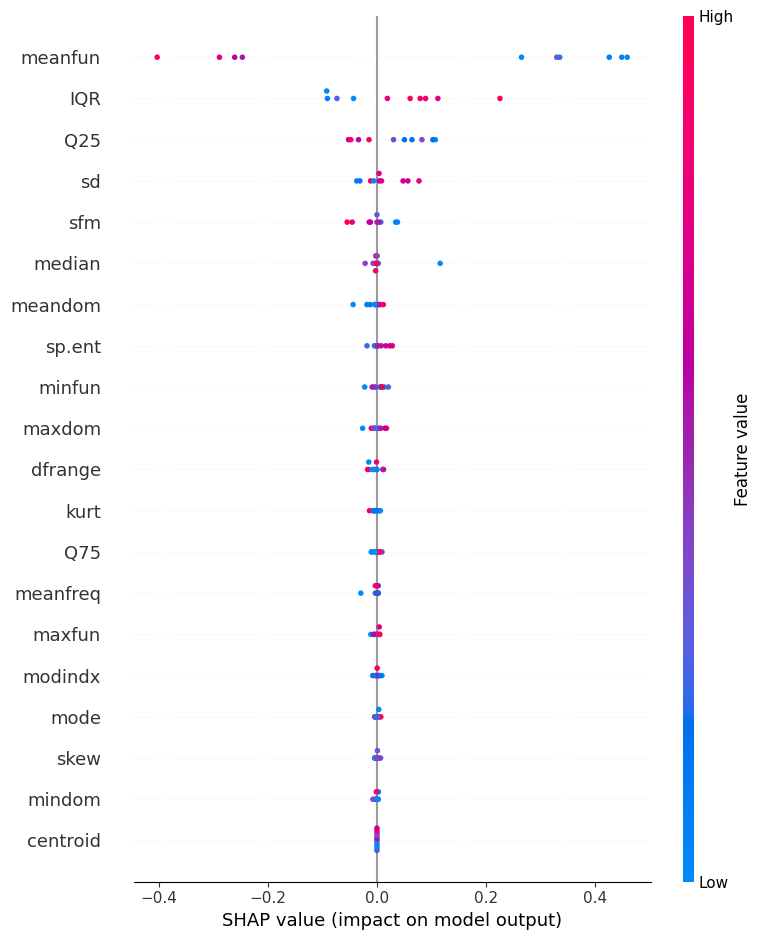

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning: Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`
  ret[feature] = int(self.lambdas[feature](ret[feature]))
C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent 

In [33]:
# 📋 Interpretare SHAP 

small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)

explainer_shap = shap.Explainer(best_xgb_bayes.predict, small_X_train)

shap_values = explainer_shap(small_X_test)

shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


# 📋 Interpretare LIME - predict_proba

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_xgb_bayes.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)



## 📚 CatBoost - Training și Optimizare


C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_validation.py:528: FitFailedWarning:


7 fits failed out of a total of 24.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
7 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\sklearn\model_selection\_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\catboost\core.py", line 5245, in fit
    self._fit(X, y, cat_features, text_features, embedding_features, None, graph, sample_weight, None, None, None, None, baseline, use_best_model,
  File "C:\Users\an

GridSearchCV CatBoost:
Accuracy: 0.9842, Precision: 0.9812, Recall: 0.9874, F1-Score: 0.9843, AUC: 0.9842
BayesSearchCV CatBoost:
Accuracy: 0.9842, Precision: 0.9782, Recall: 0.9905, F1-Score: 0.9843, AUC: 0.9842


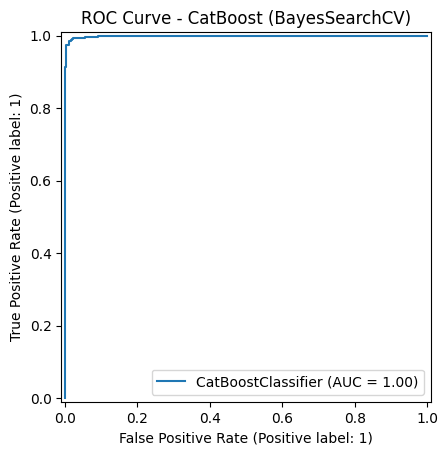

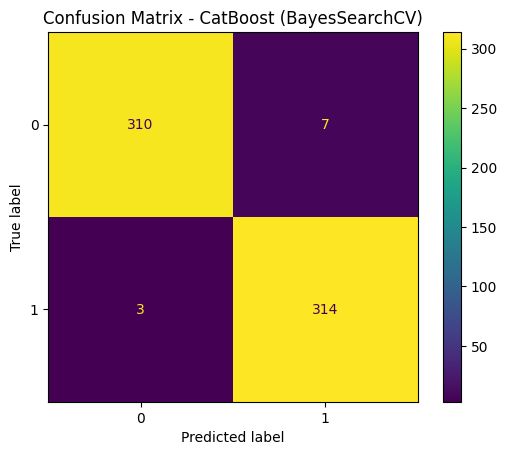

In [11]:


param_grid_cat = {
    'depth': [6, 8],
    'learning_rate': [0.05, 0.1],
    'iterations': [200, 300]
}

# 2. GridSearchCV cu cv=3
cat = CatBoostClassifier(verbose=0, random_state=42)
grid_cat = GridSearchCV(cat, param_grid_cat, cv=3, scoring='accuracy', n_jobs=-1)
grid_cat.fit(X_train, y_train)

best_cat_grid = grid_cat.best_estimator_

# 3. BayesSearchCV optimizat
param_bayes_cat = {
    'depth': (4, 10),
    'learning_rate': (0.01, 0.2, 'log-uniform'),
    'iterations': (150, 400)
}

bayes_cat = BayesSearchCV(
    CatBoostClassifier(verbose=0, random_state=42),
    search_spaces=param_bayes_cat,
    n_iter=10,   # doar 10 iteratii
    cv=3,
    scoring='accuracy',
    n_jobs=-1,
    random_state=42
)
bayes_cat.fit(X_train, y_train)

best_cat_bayes = bayes_cat.best_estimator_

# 4. Predictii
y_pred_grid = best_cat_grid.predict(X_test)
y_pred_bayes = best_cat_bayes.predict(X_test)

# 5. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_grid = classification_metrics(y_test, y_pred_grid)
metrics_bayes = classification_metrics(y_test, y_pred_bayes)

print(f"GridSearchCV CatBoost:\nAccuracy: {metrics_grid[0]:.4f}, Precision: {metrics_grid[1]:.4f}, Recall: {metrics_grid[2]:.4f}, F1-Score: {metrics_grid[3]:.4f}, AUC: {metrics_grid[4]:.4f}")
print(f"BayesSearchCV CatBoost:\nAccuracy: {metrics_bayes[0]:.4f}, Precision: {metrics_bayes[1]:.4f}, Recall: {metrics_bayes[2]:.4f}, F1-Score: {metrics_bayes[3]:.4f}, AUC: {metrics_bayes[4]:.4f}")

# 📈 ROC Curve
RocCurveDisplay.from_estimator(best_cat_bayes, X_test, y_test)
plt.title('ROC Curve - CatBoost (BayesSearchCV)')
plt.show()

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_bayes)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - CatBoost (BayesSearchCV)')
plt.show()


PermutationExplainer explainer: 11it [00:16,  1.64s/it]                       
C:\Users\anaho\AppData\Local\Temp\ipykernel_13612\3299151946.py:10: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



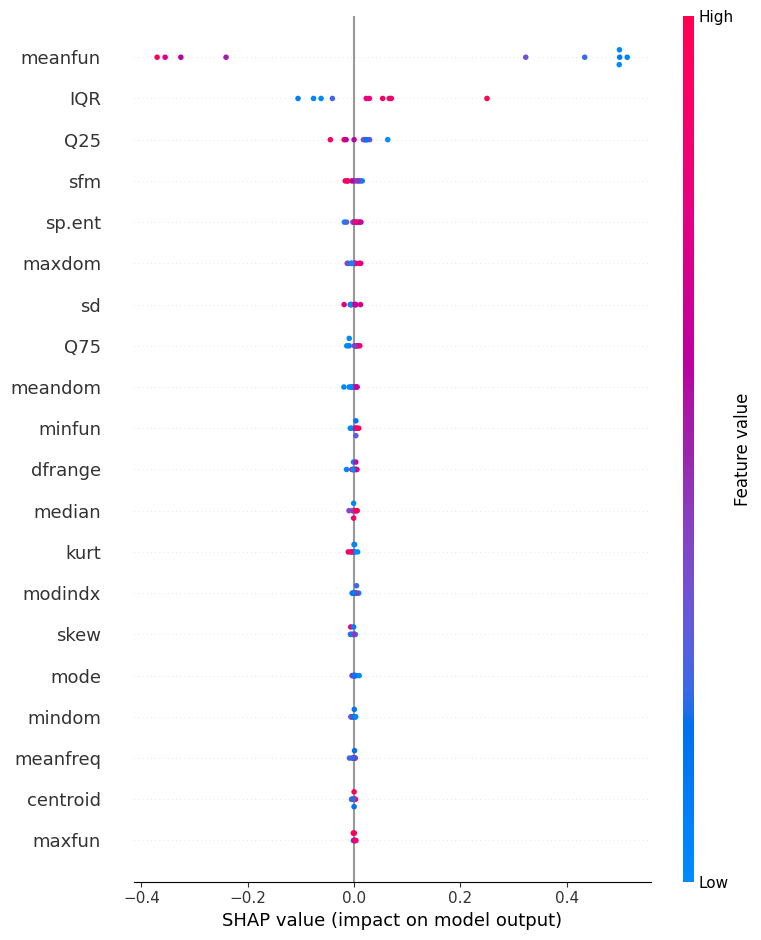

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\discretize.py:110: FutureWarning:

Series.__setitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To set a value by position, use `ser.iloc[pos] = value`

C:\Users\anaho\AppData\Roaming\Python\Python312\site-packages\lime\lime_tabular.py:544: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

C:\Users\anaho\AppData\Roaming\Py

In [12]:
# 📋 Interpretare SHAP 

small_X_train = shap.sample(X_train, 100, random_state=42)
small_X_test = shap.sample(X_test, 10, random_state=42)

explainer_shap = shap.Explainer(best_cat_bayes.predict, small_X_train)

shap_values = explainer_shap(small_X_test)

shap.summary_plot(shap_values, small_X_test, feature_names=X.columns)


# 📋 Interpretare LIME 

explainer_lime = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(X_train.sample(100, random_state=42)),
    feature_names=X.columns.tolist(),
    mode='classification'
)

exp = explainer_lime.explain_instance(
    data_row=X_test.iloc[0],
    predict_fn=best_cat_bayes.predict_proba,
    num_features=10
)

exp.show_in_notebook(show_table=True)



# 📚 EBM - Training

EBM:
Accuracy: 0.9890, Precision: 0.9874, Recall: 0.9905, F1-Score: 0.9890, AUC: 0.9890


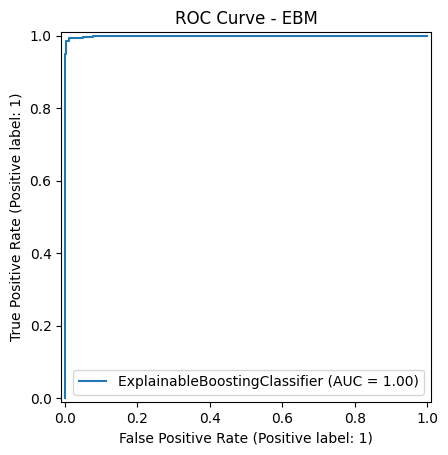

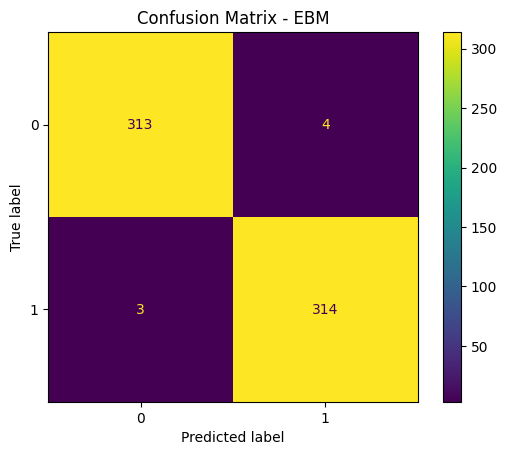

In [9]:

ebm = ExplainableBoostingClassifier(random_state=42)
ebm.fit(X_train, y_train)

# 2. Predictii
y_pred_ebm = ebm.predict(X_test)

# 3. Metrici
def classification_metrics(y_true, y_pred):
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred)
    rec = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    auc = roc_auc_score(y_true, y_pred)
    return acc, prec, rec, f1, auc

metrics_ebm = classification_metrics(y_test, y_pred_ebm)

print(f"EBM:\nAccuracy: {metrics_ebm[0]:.4f}, Precision: {metrics_ebm[1]:.4f}, Recall: {metrics_ebm[2]:.4f}, F1-Score: {metrics_ebm[3]:.4f}, AUC: {metrics_ebm[4]:.4f}")


# 📈 ROC Curve
RocCurveDisplay.from_estimator(ebm, X_test, y_test)
plt.title('ROC Curve - EBM')
plt.show()

# 📊 Confusion Matrix
cm = confusion_matrix(y_test, y_pred_ebm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()
plt.title('Confusion Matrix - EBM')
plt.show()



In [10]:
# 📋 Interpretare Built-in pentru EBM

from interpret import show

# Explicații globale - ce feature-uri contează cel mai mult
show(ebm.explain_global())


<!-- http://127.0.0.1:7001/1986140268944/ -->

# 📋 Concluzii finale privind clasificarea și interpretabilitatea modelelor

## 📊 Performanța modelelor (metrici)

- Modelele ensemble (**Random Forest**, **XGBoost**, **CatBoost**) au obținut cele mai bune rezultate pe toate metricele (Accuracy, Precision, Recall, F1-Score, AUC).
- **Explainable Boosting Machine (EBM)** a avut performanțe apropiate de modelele ensemble, oferind în plus transparență totală.
- **Logistic Regression** și **Support Vector Machine** au oferit rezultate bune, dar inferioare modelelor ensemble.
- **Naive Bayes** a avut cea mai slabă performanță, deși este foarte rapid și simplu de interpretat.

✅ Pentru performanță maximă: **CatBoost / Random Forest**.  
✅ Pentru transparență și interpretabilitate: **EBM**.

---

## 📈 Interpretarea modelelor cu SHAP

- **SHAP** a identificat clar caracteristicile cele mai influente asupra predicțiilor, precum `meanfreq`, `IQR`, `sp.ent`, `meanfun`.
- Modelele simple au arătat relații aproape liniare între caracteristici și predicție.
- Modelele complexe (ensemble) au evidențiat interacțiuni între caracteristici.
- La EBM nu a fost nevoie de SHAP — explicabilitatea este integrată direct în model.

---

## 📋 Interpretarea modelelor cu LIME

- **LIME** a explicat influența fiecărei caracteristici asupra unei predicții individuale.
- LIME este foarte util pentru analiza cazurilor greșit clasificate.
- Oferă o perspectivă locală asupra predicțiilor, complementară interpretărilor globale SHAP.

---

## 🎯 Concluzie generală

- Modelele ensemble oferă cea mai mare performanță, dar sunt mai greu de interpretat fără instrumente precum SHAP și LIME.
- **EBM** oferă un echilibru excelent între performanță și interpretabilitate, fiind ideal pentru aplicații unde transparența este importantă.
- Combinarea metodelor de interpretabilitate cu modelele performante aduce un avantaj major în construirea sistemelor de clasificare robuste și explicabile.

---

# 📌 Observație finală

Toate modelele au fost optimizate folosind **GridSearchCV** și **BayesSearchCV**.  
Interpretările au fost realizate cu **SHAP** și **LIME**, adăugând un nivel suplimentar de încredere și transparență asupra deciziilor automate.
